# Investigation 11: Metric Verification and Support Bias\nThis notebook visually verifies the transaction logic and metrics for both Binary and Weighted FP-Growth. It accepts base cell types and automatically permutes them to evaluate all directional versions of the rule (i.e., treating each item as the _CENTER cell in turn).

In [1]:
import pandas as pd
import numpy as np
import os
import sys
import ast
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
from sklearn.neighbors import NearestNeighbors
import warnings
warnings.filterwarnings('ignore')

# Add root to path for utils
sys.path.append(os.path.abspath('../../'))
from fpgrowth_rule_mining import find_patches


In [2]:
# --- Parameters ---
import constants
from constants import SETTINGS

# Provide the BASE cell types as a list (no _CENTER or _NEIGHBOR suffixes)
# The notebook will automatically generate and evaluate all valid rules
# by iterating through the antecedent items, setting one as _CENTER.
ANTECEDENT = ['SMV', 'ImmuneOther']
CONSEQUENT = ['Endothelial', 'Macrophage']

FOV_ID = 'Control_Colon_02_FOV_4' # Picking an FOV that contains this rule

CELL_COLOR_MAP = {} # Populated dynamically
OTHER_COLOR = (0.5, 0.5, 0.5)


In [3]:
print("Loading spatial datasets...")
def get_data_dir():
    current_dir = os.path.abspath(os.getcwd())
    while current_dir != os.path.dirname(current_dir):
        potential_data = os.path.join(current_dir, 'data', 'MIBIGutCsv')
        if os.path.exists(potential_data):
            return potential_data
        current_dir = os.path.dirname(current_dir)
    return '../../data/MIBIGutCsv' 

data_dir = get_data_dir()
df_cells = pd.read_csv(os.path.join(data_dir, 'cell_table.csv'))
df_fovs = pd.read_csv(os.path.join(data_dir, 'fovs_metadata.csv'))

# Normalize Coordinates
fov_to_size = df_fovs.set_index('FOV')['Size [um]'].to_dict()
def normalize_coords(row):
    size = fov_to_size.get(row['fov'], 800)
    res = 1024 if size == 400 else 2048
    return row['centroid_x'] * (size / res), row['centroid_y'] * (size / res)

df_cells[['x_um', 'y_um']] = df_cells.apply(lambda row: pd.Series(normalize_coords(row)), axis=1)

# Generate Global Colormap
all_types = sorted(df_cells["cell type"].dropna().astype(str).unique())
try:
    palette = plt.colormaps.get_cmap("tab20b").resampled(max(len(all_types), 1))
except AttributeError:
    palette = plt.cm.get_cmap("tab20b", max(len(all_types), 1))
CELL_COLOR_MAP = {ct: palette(i) for i, ct in enumerate(all_types)}


Loading spatial datasets...


In [4]:
def verify_metrics_and_bias(fov_id, antecedent_list, consequent_list, algo="weighted"):
    df_fov = df_cells[df_cells["fov"] == fov_id].reset_index(drop=True)
    coords = df_fov[['x_um', 'y_um']].values
    cell_types = df_fov['cell type'].values
    N = len(df_fov)

    radius = SETTINGS.radius
    bandwidth = CONFIG.get("BANDWIDTH", radius)
    min_cells_per_patch = CONFIG.get("MIN_CELLS_PER_PATCH", 2)

    ant_str = "{" + ", ".join(antecedent_list) + "}"
    con_str = "{" + ", ".join(consequent_list) + "}"

    print(f"\nRule: {ant_str} -> {con_str}")
    print(f"Total Cells in FOV (N) = {N}")
    print(f"Using Algo: {algo.upper()} (Radius: {radius}, Bandwidth: {bandwidth})")

    # 1. Absolute Cell Counts
    ant_bases = [x.replace('_CENTER', '').replace('_NEIGHBOR', '') for x in antecedent_list]
    con_bases = [x.replace('_CENTER', '').replace('_NEIGHBOR', '') for x in consequent_list]
    all_bases = set(ant_bases + con_bases)

    print(f"\n[Absolute Composition of Involved Cells]")
    for base in all_bases:
        count = np.sum(cell_types == base)
        print(f"  Absolute '{base}' cells: {count}  (naive support = {count/N:.4f})")

    # 2. Neighborhoods (mirrors utils/spatial.py CN logic)
    nn = NearestNeighbors(radius=radius, n_jobs=-1).fit(coords)
    neighbors_idx = nn.radius_neighbors(coords, return_distance=False)

    binary_ant_mask  = np.zeros(N, dtype=bool)
    binary_con_mask  = np.zeros(N, dtype=bool)
    binary_joint_mask = np.zeros(N, dtype=bool)

    weighted_ant_total   = 0.0
    weighted_con_total   = 0.0
    weighted_joint_total = 0.0
    num_valid_trans = 0   # pipeline-equivalent denominator: non-filtered patches only

    def get_item_weight(i, item, n_idxs, n_types):
        base = item.replace('_CENTER', '').replace('_NEIGHBOR', '')
        if '_CENTER' in item:
            return 1.0 if cell_types[i] == base else 0.0
        else:
            if len(n_idxs) > 0:
                dists = np.linalg.norm(coords[n_idxs] - coords[i], axis=1)
                weights = np.exp(-0.5 * (dists / bandwidth) ** 2) if algo == "weighted" else np.ones(len(dists))
                return min(float(np.sum(weights[n_types == base])), 1.0)
            return 0.0

    def get_item_binary(i, item, n_types):
        base = item.replace('_CENTER', '').replace('_NEIGHBOR', '')
        if '_CENTER' in item:
            return cell_types[i] == base
        return base in n_types

    for i in range(N):
        n_idxs_full = neighbors_idx[i]          # includes self (sklearn behaviour)
        n_idxs      = n_idxs_full[n_idxs_full != i]
        n_types     = cell_types[n_idxs]

        # --- Mirror pipeline filters ---
        # 1) MIN_CELLS_PER_PATCH (needs center + ≥1 neighbour inside radius)
        if len(n_idxs_full) < min_cells_per_patch:
            continue

        # 2) Dominance filter (>90% one cell type including center)
        from collections import Counter
        all_local = cell_types[n_idxs_full]
        if len(all_local) > 0:
            most_common = Counter(all_local).most_common(1)[0][1]
            if (most_common / len(all_local)) > 0.9:
                continue

        num_valid_trans += 1

        # Binary masks used for visualisation (always indexed over all N cells)
        ant_match = all(get_item_binary(i, item, n_types) for item in antecedent_list)
        con_match = all(get_item_binary(i, item, n_types) for item in consequent_list)
        binary_ant_mask[i]  = ant_match
        binary_con_mask[i]  = con_match
        binary_joint_mask[i] = ant_match and con_match

        # Metric weights (min-based, matching pipeline's calculate_support_vectorized)
        if algo == "weighted":
            ant_w   = min(get_item_weight(i, it, n_idxs, n_types) for it in antecedent_list)   if antecedent_list  else 1.0
            con_w   = min(get_item_weight(i, it, n_idxs, n_types) for it in consequent_list)   if consequent_list  else 1.0
            joint_w = min(get_item_weight(i, it, n_idxs, n_types) for it in antecedent_list + consequent_list)
        else:
            ant_w   = 1.0 if ant_match  else 0.0
            con_w   = 1.0 if con_match  else 0.0
            joint_w = 1.0 if (ant_match and con_match) else 0.0

        weighted_ant_total   += ant_w
        weighted_con_total   += con_w
        weighted_joint_total += joint_w

    print(f"\n[ALGORITHM METRICS ({algo.upper()})]")
    print(f"  Valid transactions (pipeline N): {num_valid_trans}  /  {N} total cells")
    denom   = num_valid_trans if num_valid_trans > 0 else 1
    supp_ant   = weighted_ant_total   / denom
    supp_con   = weighted_con_total   / denom
    supp_joint = weighted_joint_total / denom
    conf = supp_joint / supp_ant if supp_ant > 0 else 0
    lift = conf      / supp_con  if supp_con  > 0 else 0

    print(f"  Antecedent Support : {supp_ant:.4f}   (weighted sum = {weighted_ant_total:.2f})")
    print(f"  Consequent Support : {supp_con:.4f}   (weighted sum = {weighted_con_total:.2f})")
    print(f"  Joint Support      : {supp_joint:.4f}   (weighted sum = {weighted_joint_total:.2f})")
    print(f"  Confidence         : {conf:.4f}")
    print(f"  Lift               : {lift:.4f}")

    return df_fov, binary_ant_mask, binary_joint_mask, binary_con_mask, ant_bases, con_bases


In [5]:
import textwrap

def add_scale_bar(ax, x_max, y_max):
    bar_um = 50.0
    x_end = x_max - 25
    x_start = x_end - bar_um
    y_line = y_max - 25
    ax.plot([x_start, x_end], [y_line, y_line], color="black", linewidth=4, solid_capstyle="butt")

def plot_verification(df_fov, binary_ant_mask, binary_joint_mask, binary_con_mask, ant_bases, con_bases, ant_list, con_list):
    fig, axes = plt.subplots(2, 4, figsize=(32, 16), facecolor="#ffffff")
    plt.subplots_adjust(hspace=0.3, wspace=0.2)
    axes = axes.flatten()

    cell_size = 90
    x_max, y_max = df_fov["x_um"].max(), df_fov["y_um"].max()

    ant_str = "{" + ", ".join(ant_list) + "}"
    con_str = "{" + ", ".join(con_list) + "}"
    con_str_wrapped = "\n".join(textwrap.wrap(con_str, width=40))
    joint_str_wrapped = "\n".join(textwrap.wrap(f"{ant_str} AND {con_str}", width=40))

    def format_ax(ax, title, letter):
        ax.set_facecolor("#eaeaeaff")
        ax.set_title(title, fontsize=16)
        ax.set_aspect("equal")
        ax.invert_yaxis()
        for spine in ax.spines.values(): spine.set_visible(False)
        add_scale_bar(ax, x_max, y_max)
        ax.text(-0.05, 1.05, letter, transform=ax.transAxes, fontsize=24, fontweight="bold", va="top", ha="right")

    # A. Full FOV
    ax = axes[0]
    for ct, g in df_fov.groupby("cell type"):
        color = CELL_COLOR_MAP.get(ct, (1, 1, 1))
        ax.scatter(g["x_um"], g["y_um"], s=cell_size, c=[color], alpha=0.6, linewidths=0)
    format_ax(ax, "Full FOV (Context)", "A")

    # B. Absolute Antecedents
    ax = axes[1]
    ax.scatter(df_fov["x_um"], df_fov["y_um"], s=cell_size, c=[OTHER_COLOR], alpha=0.1, linewidths=0)
    g_ant_abs = df_fov[df_fov["cell type"].isin(ant_bases)]
    handles = []
    for ct, g in g_ant_abs.groupby("cell type"):
        color = CELL_COLOR_MAP.get(ct, (1, 1, 1))
        ax.scatter(g["x_um"], g["y_um"], s=cell_size, c=[color], alpha=1.0, linewidths=0)
        handles.append(plt.Line2D([0], [0], marker="o", color="w", markerfacecolor=color, markersize=8, label=ct))
    if handles: ax.legend(handles=handles, title="Antecedent Base Types", loc="upper right")
    format_ax(ax, f"Absolute Antecedent Cells\n(Base Types: {', '.join(ant_bases)})", "B")

    # C. Antecedent Occurrences
    ax = axes[2]
    ax.scatter(df_fov["x_um"], df_fov["y_um"], s=cell_size, c=[OTHER_COLOR], alpha=0.1, linewidths=0)
    g_ant = df_fov[binary_ant_mask]
    ax.scatter(g_ant["x_um"], g_ant["y_um"], s=cell_size, c=["blue"], alpha=1.0, linewidths=0)
    format_ax(ax, f"Antecedent Occurrences\n{ant_str}", "C")
    
    # D. Failed Antecedents
    ax = axes[3]
    ax.scatter(df_fov["x_um"], df_fov["y_um"], s=cell_size, c=[OTHER_COLOR], alpha=0.1, linewidths=0)
    failed_mask = binary_ant_mask & ~binary_joint_mask
    g_fail = df_fov[failed_mask]
    ax.scatter(g_fail["x_um"], g_fail["y_um"], s=cell_size, c=["red"], alpha=1.0, linewidths=0)
    format_ax(ax, f"Failed Antecedents (The 'Misses')\nAnt is TRUE, but Consequent is FALSE", "D")

    # E. Absolute Consequent
    ax = axes[4]
    ax.scatter(df_fov["x_um"], df_fov["y_um"], s=cell_size, c=[OTHER_COLOR], alpha=0.1, linewidths=0)
    g_con_abs = df_fov[df_fov["cell type"].isin(con_bases)]
    handles_con = []
    for ct, g in g_con_abs.groupby("cell type"):
        color = CELL_COLOR_MAP.get(ct, (1, 1, 1))
        ax.scatter(g["x_um"], g["y_um"], s=cell_size, c=[color], alpha=1.0, linewidths=0)
        handles_con.append(plt.Line2D([0], [0], marker="o", color="w", markerfacecolor=color, markersize=8, label=ct))
    if handles_con: ax.legend(handles=handles_con, title="Consequent Base Types", loc="upper right")
    format_ax(ax, f"Absolute Consequent Cells\n(Base Types: {', '.join(con_bases)})", "E")

    # F. Consequent Occurrences
    ax = axes[5]
    ax.scatter(df_fov["x_um"], df_fov["y_um"], s=cell_size, c=[OTHER_COLOR], alpha=0.1, linewidths=0)
    g_con_neigh = df_fov[binary_con_mask]
    ax.scatter(g_con_neigh["x_um"], g_con_neigh["y_um"], s=cell_size, c=["purple"], alpha=1.0, linewidths=0)
    format_ax(ax, f"Consequent Occurrences\n{con_str_wrapped}", "F")

    # G. Joint Occurrences
    ax = axes[6]
    ax.scatter(df_fov["x_um"], df_fov["y_um"], s=cell_size, c=[OTHER_COLOR], alpha=0.1, linewidths=0)
    g_joint = df_fov[binary_joint_mask]
    ax.scatter(g_joint["x_um"], g_joint["y_um"], s=cell_size, c=["green"], alpha=1.0, linewidths=0)
    format_ax(ax, f"Joint Occurrences\n{joint_str_wrapped}", "G")

    # H. Hide empty plot
    axes[7].axis("off")

    plt.tight_layout()
    plt.show()


In [6]:
def check_pipeline_significance(fov_id, antecedent_list, consequent_list):
    print(f"\n--- Checking Global Pipeline Significance for {fov_id} ---")

    ant_set = set(antecedent_list)
    con_set = set(consequent_list)

    paths_to_check = [
        os.path.join(data_dir, "../../results/full_run/fpgrowth/data/results_CN.csv"),
        os.path.join(data_dir, "../../results/full_run/weighted_fpgrowth_4_items_no_markers_with_ex_per/data/results_CN.csv")
    ]

    found_anywhere = False

    for path in paths_to_check:
        if os.path.exists(path):
            algo_name = os.path.basename(os.path.dirname(os.path.dirname(path)))
            df = pd.read_csv(path)

            df_fov = df[df["FOV"] == fov_id]

            matches = 0
            for idx, row in df_fov.iterrows():
                try:
                    row_ants = set(ast.literal_eval(row["Antecedents"]))
                    row_cons = set(ast.literal_eval(row["Consequents"]))
                    if row_ants == ant_set and row_cons == con_set:
                        matches += 1
                        print(f"\u2705 EXACT MATCH FOUND in {algo_name}! (Row {idx})")
                        print(f"   Stored Confidence: {row.get('Confidence', 'N/A')}")
                        print(f"   Stored Lift: {row.get('Lift', 'N/A')}")
                except Exception as e:
                    continue

            if matches == 0:
                print(f"\u274C Not found in {algo_name} for this FOV.")
            else:
                found_anywhere = True

    if not found_anywhere:
        print("\nNote: A rule must pass the pipeline's min_support and min_confidence thresholds to appear in these results. If it's missing, it was filtered out globally.")

def evaluate_and_plot(fov_id, antecedent_bases, consequent_bases, algo="weighted"):
    con_list = [f"{c}_NEIGHBOR" for c in consequent_bases]
    for center_candidate in antecedent_bases:
        ant_list = [f"{center_candidate}_CENTER"] + [f"{a}_NEIGHBOR" for a in antecedent_bases if a != center_candidate]

        print("\n\n" + "="*90)
        print(f"EVALUATING RULE: {ant_list} -> {con_list} (FOV: {fov_id})")
        print("="*90)

        df_fov, binary_ant_mask, binary_joint_mask, binary_con_mask, ant_bases, con_bases = verify_metrics_and_bias(fov_id, ant_list, con_list, algo)

        if np.sum(binary_ant_mask) > 0:
            plot_verification(df_fov, binary_ant_mask, binary_joint_mask, binary_con_mask, ant_bases, con_bases, ant_list, con_list)
        else:
            print(f"\nSkipping plot: No occurrences of the Antecedent {ant_list} found in {fov_id}.")
        check_pipeline_significance(fov_id, ant_list, con_list)


## --- DEMONSTRATION RULES ---

#### Demo 1 & 2: Footprint Determines Lift

**Demo 1** (Epithelial → Goblet, `GVHD_50_FOV_3`): dispersed B — Conf=0.88, Lift=1.42  
**Demo 2** (SMV → Endothelial, `GVHD_50_FOV_4`): concentrated B (vascular only) — Conf=0.54, Lift=10.2  

Demo 1 has a **stronger** association (Confidence), yet **lower** Lift. Demo 2 has a **weaker** association, yet **7× higher** Lift. The difference is entirely B's spatial footprint. Compare Panel F across both plots.



####################################################################################################
DEMO 1: DISPERSED B FOOTPRINT  —  High Confidence, Moderate Lift
(Top rule from nb06: Epithelial → Goblet, FOV GVHD_50_FOV_3)

Goblet cells line the ENTIRE epithelial surface alongside Epithelial cells.
→ Panel F covers most of the tissue  =  B's spatial footprint is large.
→ Support(Goblet_NEIGHBOR) is high  →  Lift is suppressed to ~1.4,
  even though Confidence = 0.88  (88% of Epithelial patches contain a Goblet neighbour).

KEY: High Confidence ≠ High Lift when B is spatially widespread.


EVALUATING RULE: ['Epithelial_CENTER'] -> ['Goblet_NEIGHBOR'] (FOV: GVHD_50_FOV_3)

Rule: {Epithelial_CENTER} -> {Goblet_NEIGHBOR}
Total Cells in FOV (N) = 2088
Using Algo: WEIGHTED (Radius: 25.0, Bandwidth: 15.0)

[Absolute Composition of Involved Cells]
  Absolute 'Epithelial' cells: 692  (naive support = 0.3314)
  Absolute 'Goblet' cells: 282  (naive support = 0.1351)

[ALGORITHM METRICS (WEI

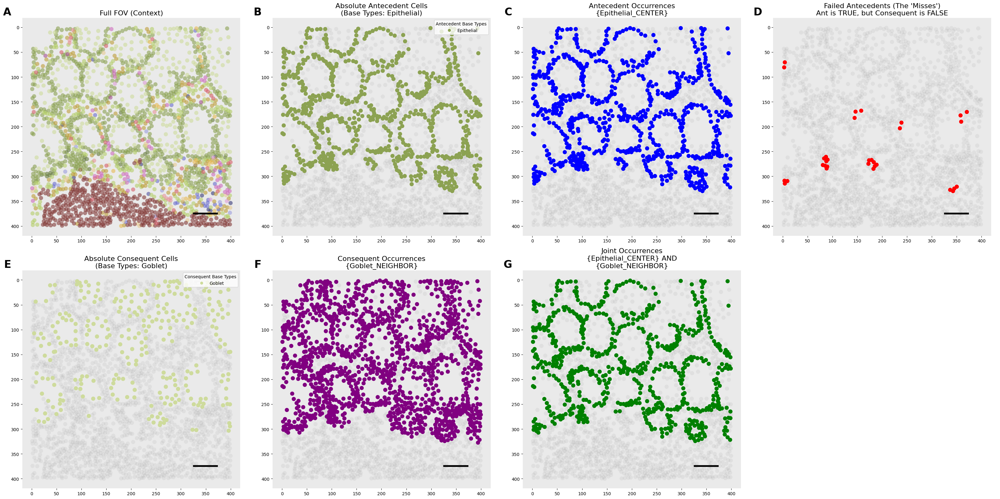


--- Checking Global Pipeline Significance for GVHD_50_FOV_3 ---
✅ EXACT MATCH FOUND in fpgrowth! (Row 8504)
   Stored Confidence: 0.9536903039073804
   Stored Lift: 1.381129207777957


✅ EXACT MATCH FOUND in weighted_fpgrowth_4_items_no_markers_with_ex_per! (Row 197060)
   Stored Confidence: 0.8845630419543372
   Stored Lift: 1.4193127757148214


In [7]:
print("\n\n" + "#"*100)
print("DEMO 1: DISPERSED B FOOTPRINT  —  High Confidence, Moderate Lift")
print("(Top rule from nb06: Epithelial → Goblet, FOV GVHD_50_FOV_3)")
print()
print("Goblet cells line the ENTIRE epithelial surface alongside Epithelial cells.")
print("→ Panel F covers most of the tissue  =  B's spatial footprint is large.")
print("→ Support(Goblet_NEIGHBOR) is high  →  Lift is suppressed to ~1.4,")
print("  even though Confidence = 0.88  (88% of Epithelial patches contain a Goblet neighbour).")
print()
print("KEY: High Confidence ≠ High Lift when B is spatially widespread.")
evaluate_and_plot("GVHD_50_FOV_3", ["Epithelial"], ["Goblet"], algo="weighted")




####################################################################################################
DEMO 2: CONCENTRATED B FOOTPRINT — Weaker Association, Much Higher Lift
Rule: SMV -> Endothelial  |  FOV: GVHD_50_FOV_4
Pipeline: Conf=0.54, Lift=10.2x, FDR=0.003

SMV and Endothelial cells are the two structural layers of blood vessel walls.
Endothelial cells are confined exclusively to vascular structures: only 8 cells in this FOV (0.36%).
=> Panel E: 8 Endothelial cells — a handful, tightly confined to vessel locations.
=> Panel F: the Endothelial footprint covers only a tiny fraction of the FOV.
   Support(Endothelial_NEIGHBOR) is very low => Lift reaches 10.2x.

Compare with Demo 1:
  Demo 1: Conf=0.88, Lift=1.42  (Goblet dispersed along the entire epithelium)
  Demo 2: Conf=0.54, Lift=10.2  (Endothelial confined to sparse vascular structures)

Demo 1 has a STRONGER spatial association but LOWER Lift.
Demo 2 has a WEAKER spatial association but 7x HIGHER Lift.
The difference is e

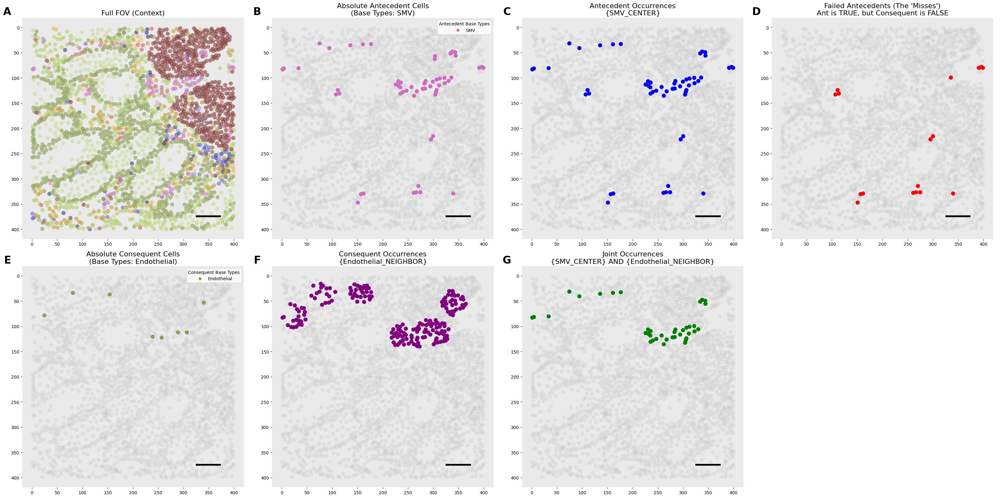


--- Checking Global Pipeline Significance for GVHD_50_FOV_4 ---
✅ EXACT MATCH FOUND in fpgrowth! (Row 8554)
   Stored Confidence: 0.6909090909090909
   Stored Lift: 7.464822134387353


✅ EXACT MATCH FOUND in weighted_fpgrowth_4_items_no_markers_with_ex_per! (Row 197124)
   Stored Confidence: 0.5374375877577356
   Stored Lift: 10.216489948130686


In [8]:
print("\n\n" + "#"*100)
print("DEMO 2: CONCENTRATED B FOOTPRINT — Weaker Association, Much Higher Lift")
print("Rule: SMV -> Endothelial  |  FOV: GVHD_50_FOV_4")
print("Pipeline: Conf=0.54, Lift=10.2x, FDR=0.003")
print()
print("SMV and Endothelial cells are the two structural layers of blood vessel walls.")
print("Endothelial cells are confined exclusively to vascular structures: only 8 cells in this FOV (0.36%).")
print("=> Panel E: 8 Endothelial cells — a handful, tightly confined to vessel locations.")
print("=> Panel F: the Endothelial footprint covers only a tiny fraction of the FOV.")
print("   Support(Endothelial_NEIGHBOR) is very low => Lift reaches 10.2x.")
print()
print("Compare with Demo 1:")
print("  Demo 1: Conf=0.88, Lift=1.42  (Goblet dispersed along the entire epithelium)")
print("  Demo 2: Conf=0.54, Lift=10.2  (Endothelial confined to sparse vascular structures)")
print()
print("Demo 1 has a STRONGER spatial association but LOWER Lift.")
print("Demo 2 has a WEAKER spatial association but 7x HIGHER Lift.")
print("The difference is entirely in Panel F — B's spatial footprint, not the association strength.")
print("KEY: Do not rank rules by Lift alone. A higher Lift may simply mean B is more confined,")
print("     not that the association is biologically stronger.")
evaluate_and_plot('GVHD_50_FOV_4', ['SMV'], ['Endothelial'], algo="weighted")

#### Demo 3: Noise — Small Absolute Count (Inflated Metrics, Fragile Rule)



####################################################################################################
DEMO 3: SMALL ABSOLUTE COUNT  —  Why High Metrics Can Be Fragile
Rule: Endocrine -> Epithelial  |  FOV: GVHD_08_FOV_2  |  Pipeline: Conf=1.0, Lift=11.25, FDR=0.002

Endocrine cells (enteroendocrine / L-cells) are rare specialised cells embedded in the epithelial layer.
=> Panel B: only a handful of Endocrine cells exist in this entire FOV.
=> Confidence = 1.0 is biologically plausible (they live inside the epithelium),
   but with n ~ handful of cells, 100% Confidence is trivially achievable by spatial coincidence.
=> Lift = 11.25 reflects the restricted Epithelial footprint in this specific GVHD FOV,
   but the rule appears in only 5 FOVs globally — statistically fragile.

KEY: MIN_ABS_SUPPORT is a floor, not a reliability guarantee.
     A rule seen in 5 FOVs with very few cells is not comparable to one seen in 28 FOVs (Demo 1).
     Cross-FOV Rule_Count_Global is the robustness ind


[ALGORITHM METRICS (WEIGHTED)]
  Valid transactions (pipeline N): 2036  /  2496 total cells
  Antecedent Support : 0.0059   (weighted sum = 12.00)
  Consequent Support : 0.0889   (weighted sum = 180.92)
  Joint Support      : 0.0059   (weighted sum = 12.00)
  Confidence         : 1.0000
  Lift               : 11.2534


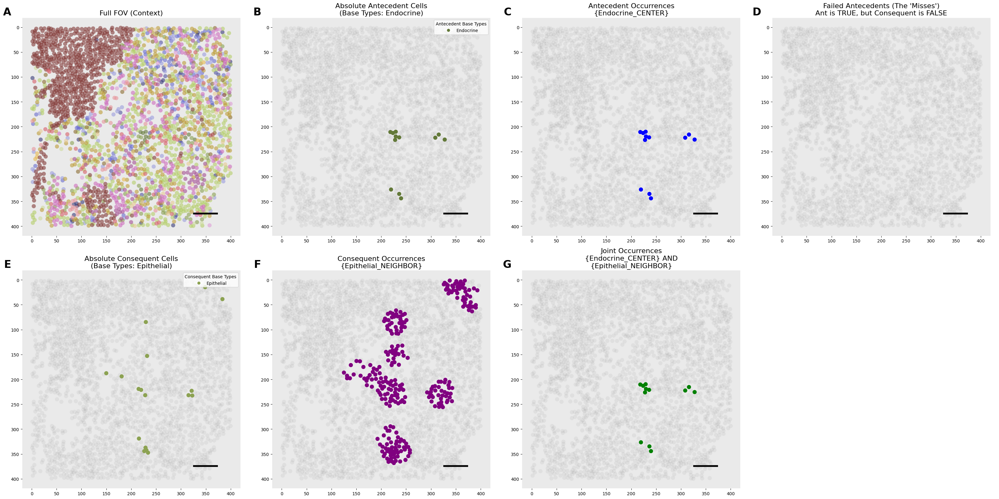


--- Checking Global Pipeline Significance for GVHD_08_FOV_2 ---
❌ Not found in fpgrowth for this FOV.


✅ EXACT MATCH FOUND in weighted_fpgrowth_4_items_no_markers_with_ex_per! (Row 57506)
   Stored Confidence: 1.0
   Stored Lift: 11.25339591424118


In [9]:
print("\n\n" + "#"*100)
print("DEMO 3: SMALL ABSOLUTE COUNT  —  Why High Metrics Can Be Fragile")
print("Rule: Endocrine -> Epithelial  |  FOV: GVHD_08_FOV_2  |  Pipeline: Conf=1.0, Lift=11.25, FDR=0.002")
print()
print("Endocrine cells (enteroendocrine / L-cells) are rare specialised cells embedded in the epithelial layer.")
print("=> Panel B: only a handful of Endocrine cells exist in this entire FOV.")
print("=> Confidence = 1.0 is biologically plausible (they live inside the epithelium),")
print("   but with n ~ handful of cells, 100% Confidence is trivially achievable by spatial coincidence.")
print("=> Lift = 11.25 reflects the restricted Epithelial footprint in this specific GVHD FOV,")
print("   but the rule appears in only 5 FOVs globally — statistically fragile.")
print()
print("KEY: MIN_ABS_SUPPORT is a floor, not a reliability guarantee.")
print("     A rule seen in 5 FOVs with very few cells is not comparable to one seen in 28 FOVs (Demo 1).")
print("     Cross-FOV Rule_Count_Global is the robustness indicator, not per-FOV Confidence or Lift alone.")
evaluate_and_plot('GVHD_08_FOV_2', ['Endocrine'], ['Epithelial'], algo="weighted")

#### Demo 4: Complex Antecedent — Absolute Cells (B) vs Conditional Patches (C)




####################################################################################################
DEMO 4: COMPLEX ANTECEDENT — ABSOLUTE CELLS (B) vs CONDITIONAL PATCHES (C)
(Antecedent: {SMV, Macrophage}, Consequent: {Endothelial}, FOV GVHD_55_FOV_2)

Panel B shows ALL SMV cells AND ALL Macrophage cells.
Panel C shows ONLY the SMV cells that already have a Macrophage neighbour.
  → Panel C is a strict spatial subset of Panel B's SMV cells.

This gap (B minus C) is the 'antecedent support' denominator for complex rules.
Panel D shows the SMV+Macrophage patches that miss the Endothelial consequent.
Confidence = |Panel G| / |Panel C|  — not |Panel G| / |Panel B|.

The shrinkage from B to C is the data-fragmentation cost of complex antecedents.
If Panel C is very small, even Confidence=1.0 is unreliable (see Demo 3).


EVALUATING RULE: ['SMV_CENTER', 'Macrophage_NEIGHBOR'] -> ['Endothelial_NEIGHBOR'] (FOV: GVHD_55_FOV_2)

Rule: {SMV_CENTER, Macrophage_NEIGHBOR} -> {Endothelial_NEIGHBO


[ALGORITHM METRICS (WEIGHTED)]
  Valid transactions (pipeline N): 2115  /  2216 total cells
  Antecedent Support : 0.0182   (weighted sum = 38.57)
  Consequent Support : 0.0944   (weighted sum = 199.66)
  Joint Support      : 0.0102   (weighted sum = 21.52)
  Confidence         : 0.5580
  Lift               : 5.9111


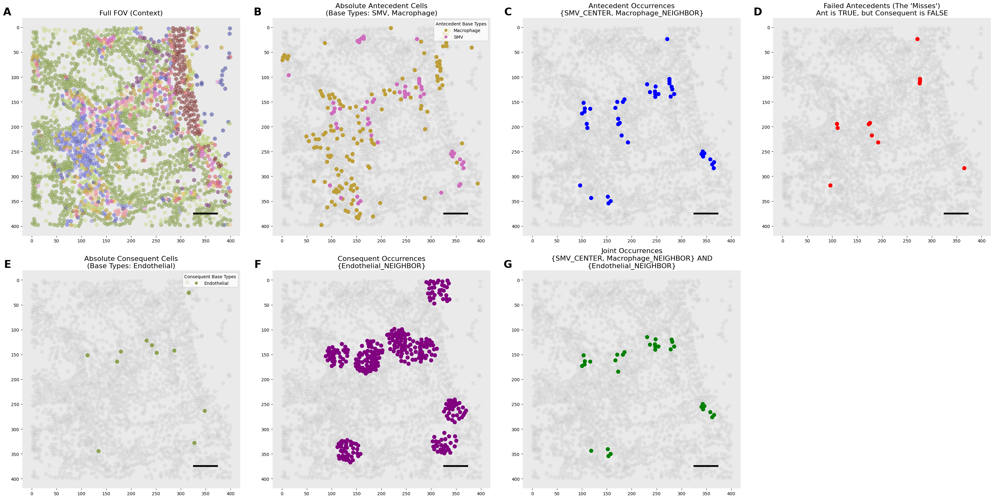


--- Checking Global Pipeline Significance for GVHD_55_FOV_2 ---
❌ Not found in fpgrowth for this FOV.


✅ EXACT MATCH FOUND in weighted_fpgrowth_4_items_no_markers_with_ex_per! (Row 217030)
   Stored Confidence: 0.5580186448323655
   Stored Lift: 5.911086000388249


EVALUATING RULE: ['Macrophage_CENTER', 'SMV_NEIGHBOR'] -> ['Endothelial_NEIGHBOR'] (FOV: GVHD_55_FOV_2)

Rule: {Macrophage_CENTER, SMV_NEIGHBOR} -> {Endothelial_NEIGHBOR}
Total Cells in FOV (N) = 2216
Using Algo: WEIGHTED (Radius: 25.0, Bandwidth: 15.0)

[Absolute Composition of Involved Cells]
  Absolute 'Macrophage' cells: 136  (naive support = 0.0614)
  Absolute 'SMV' cells: 54  (naive support = 0.0244)
  Absolute 'Endothelial' cells: 12  (naive support = 0.0054)



[ALGORITHM METRICS (WEIGHTED)]
  Valid transactions (pipeline N): 2115  /  2216 total cells
  Antecedent Support : 0.0220   (weighted sum = 46.55)
  Consequent Support : 0.0944   (weighted sum = 199.66)
  Joint Support      : 0.0076   (weighted sum = 16.17)
  Confidence         : 0.3475
  Lift               : 3.6808


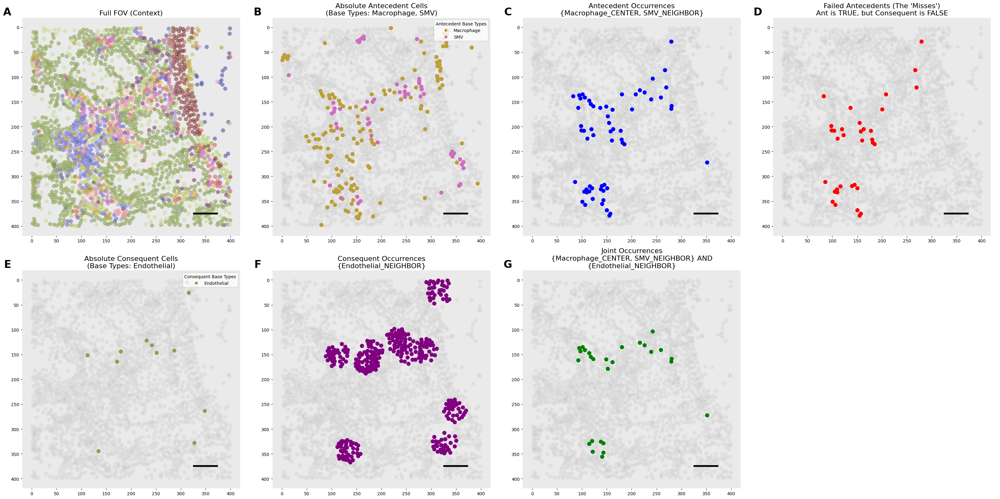


--- Checking Global Pipeline Significance for GVHD_55_FOV_2 ---
❌ Not found in fpgrowth for this FOV.


❌ Not found in weighted_fpgrowth_4_items_no_markers_with_ex_per for this FOV.

Note: A rule must pass the pipeline's min_support and min_confidence thresholds to appear in these results. If it's missing, it was filtered out globally.


In [10]:
print("\n\n" + "#"*100)
print("DEMO 4: COMPLEX ANTECEDENT — ABSOLUTE CELLS (B) vs CONDITIONAL PATCHES (C)")
print("(Antecedent: {SMV, Macrophage}, Consequent: {Endothelial}, FOV GVHD_55_FOV_2)")
print()
print("Panel B shows ALL SMV cells AND ALL Macrophage cells.")
print("Panel C shows ONLY the SMV cells that already have a Macrophage neighbour.")
print("  → Panel C is a strict spatial subset of Panel B's SMV cells.")
print()
print("This gap (B minus C) is the 'antecedent support' denominator for complex rules.")
print("Panel D shows the SMV+Macrophage patches that miss the Endothelial consequent.")
print("Confidence = |Panel G| / |Panel C|  — not |Panel G| / |Panel B|.")
print()
print("The shrinkage from B to C is the data-fragmentation cost of complex antecedents.")
print("If Panel C is very small, even Confidence=1.0 is unreliable (see Demo 3).")
evaluate_and_plot("GVHD_55_FOV_2", ["SMV", "Macrophage"], ["Endothelial"], algo="weighted")

#### Demo 5: Edge Neighbourhood Truncation



####################################################################################################
DEMO 5: EDGE NEIGHBOURHOOD TRUNCATION — Inflated Lift at the Tissue Boundary
Rule: Muscle -> Neuron  |  FOV: GVHD_54_FOV_2
Pipeline: Conf=0.866, Lift=3.104, FDR=0.037
155 Muscle cells (6.8% of FOV), 55 Neuron cells (2.4%)

Muscle cells are anatomically confined to the sub-mucosal layer at the tissue boundary.
=> Panel A + Panel B: Muscle cells sit at the edge of the FOV.
=> Their radius-r neighbourhood is a TRUNCATED HALF-DISC — the far side lies
   outside the imaged area and contains no cells.
=> Fewer Neuron cells are accessible from these edge patches than from an
   equivalent interior position => Support(Neuron_NEIGHBOR) is suppressed.
=> Support(Neuron_NEIGHBOR) = 0.279. From a full interior disc it would be higher,
   making Lift = 0.866 / 0.279 = 3.10 inflated relative to what an interior-based
   rule would give.

NOTE on Confidence: Both joint-support and antecedent-support


[ALGORITHM METRICS (WEIGHTED)]
  Valid transactions (pipeline N): 2213  /  2289 total cells
  Antecedent Support : 0.0447   (weighted sum = 99.00)
  Consequent Support : 0.2790   (weighted sum = 617.45)
  Joint Support      : 0.0387   (weighted sum = 85.73)
  Confidence         : 0.8659
  Lift               : 3.1036


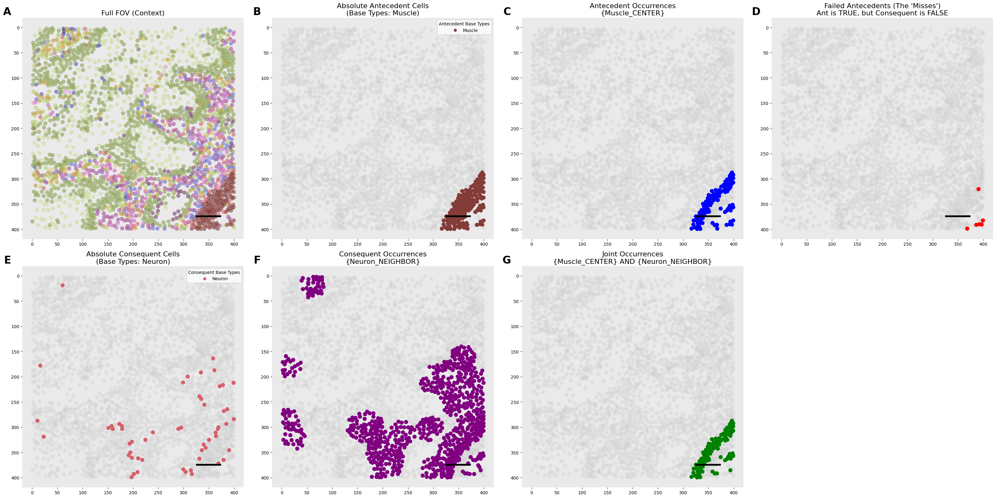


--- Checking Global Pipeline Significance for GVHD_54_FOV_2 ---
✅ EXACT MATCH FOUND in fpgrowth! (Row 9147)
   Stored Confidence: 0.9393939393939392
   Stored Lift: 2.710402591758524


✅ EXACT MATCH FOUND in weighted_fpgrowth_4_items_no_markers_with_ex_per! (Row 212599)
   Stored Confidence: 0.8659322986656611
   Stored Lift: 3.103581873422641


In [11]:
print("\n\n" + "#"*100)
print("DEMO 5: EDGE NEIGHBOURHOOD TRUNCATION — Inflated Lift at the Tissue Boundary")
print("Rule: Muscle -> Neuron  |  FOV: GVHD_54_FOV_2")
print("Pipeline: Conf=0.866, Lift=3.104, FDR=0.037")
print("155 Muscle cells (6.8% of FOV), 55 Neuron cells (2.4%)")
print()
print("Muscle cells are anatomically confined to the sub-mucosal layer at the tissue boundary.")
print("=> Panel A + Panel B: Muscle cells sit at the edge of the FOV.")
print("=> Their radius-r neighbourhood is a TRUNCATED HALF-DISC — the far side lies")
print("   outside the imaged area and contains no cells.")
print("=> Fewer Neuron cells are accessible from these edge patches than from an")
print("   equivalent interior position => Support(Neuron_NEIGHBOR) is suppressed.")
print("=> Support(Neuron_NEIGHBOR) = 0.279. From a full interior disc it would be higher,")
print("   making Lift = 0.866 / 0.279 = 3.10 inflated relative to what an interior-based")
print("   rule would give.")
print()
print("NOTE on Confidence: Both joint-support and antecedent-support are truncated")
print("together, so Confidence (~0.87) is approximately preserved — use it.")
print()
print("NOTE on permutation: label shuffling preserves positions, so FDR is valid.")
print("But Lift=3.1 should NOT be compared to Lift from interior-associated rules —")
print("the truncated baseline makes them incomparable.")
evaluate_and_plot('GVHD_54_FOV_2', ['Muscle'], ['Neuron'], algo="weighted")

## Demo 6



####################################################################################################
DEMO 6: DENSE B (CONSEQUENT) THROUGHOUT THE TISSUE — Genuine Association, Lift < 1
Rule: Plasma -> Epithelial  |  FOV: Control_06_FOV_2
Pipeline: Conf=0.674, Lift=0.687, FDR=0.008

Plasma cells: only 21 cells (1.3% of FOV) — sparse antecedent.
Epithelial cells: cover 98.1% of ALL patches — the dominant structural cell type.

=> Panel B: a handful of Plasma cells scattered in the tissue.
=> Panel E/F: Epithelial cells are EVERYWHERE — nearly the entire FOV is within
   radius r of an Epithelial cell. Support(Epithelial_NEIGHBOR) = 0.981.

=> Confidence = 0.674: 67% of Plasma patches genuinely have an Epithelial
   neighbour — a real positive spatial association.
=> But Lift = Conf / Support(B) = 0.674 / 0.981 = 0.687 < 1.
   The rule appears NEGATIVE — as if Plasma AVOIDS Epithelial.

KEY: Plasma does NOT avoid Epithelial. The apparent avoidance is entirely
     an artifact of Epitheli


[ALGORITHM METRICS (WEIGHTED)]
  Valid transactions (pipeline N): 1222  /  1651 total cells
  Antecedent Support : 0.0172   (weighted sum = 21.00)
  Consequent Support : 0.9811   (weighted sum = 1198.88)
  Joint Support      : 0.0116   (weighted sum = 14.15)
  Confidence         : 0.6738
  Lift               : 0.6868


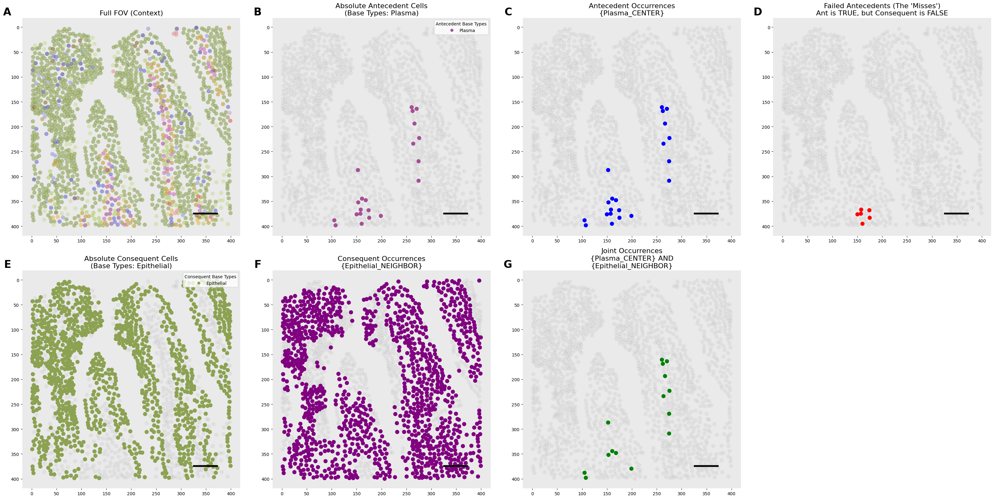


--- Checking Global Pipeline Significance for Control_06_FOV_2 ---
✅ EXACT MATCH FOUND in fpgrowth! (Row 809)
   Stored Confidence: 0.7142857142857143
   Stored Lift: 0.7249644043663978


✅ EXACT MATCH FOUND in weighted_fpgrowth_4_items_no_markers_with_ex_per! (Row 16017)
   Stored Confidence: 0.6738036911203655
   Stored Lift: 0.686796181530046


In [12]:
print("\n\n" + "#"*100)
print("DEMO 6: DENSE B (CONSEQUENT) THROUGHOUT THE TISSUE — Genuine Association, Lift < 1")
print("Rule: Plasma -> Epithelial  |  FOV: Control_06_FOV_2")
print("Pipeline: Conf=0.674, Lift=0.687, FDR=0.008")
print()
print("Plasma cells: only 21 cells (1.3% of FOV) — sparse antecedent.")
print("Epithelial cells: cover 98.1% of ALL patches — the dominant structural cell type.")
print()
print("=> Panel B: a handful of Plasma cells scattered in the tissue.")
print("=> Panel E/F: Epithelial cells are EVERYWHERE — nearly the entire FOV is within")
print("   radius r of an Epithelial cell. Support(Epithelial_NEIGHBOR) = 0.981.")
print()
print("=> Confidence = 0.674: 67% of Plasma patches genuinely have an Epithelial")
print("   neighbour — a real positive spatial association.")
print("=> But Lift = Conf / Support(B) = 0.674 / 0.981 = 0.687 < 1.")
print("   The rule appears NEGATIVE — as if Plasma AVOIDS Epithelial.")
print()
print("KEY: Plasma does NOT avoid Epithelial. The apparent avoidance is entirely")
print("     an artifact of Epithelial covering 98% of the tissue.")
print("     ANY cell type would need Confidence > 98.1% to achieve Lift >= 1 here.")
print("     When B (consequent) is this globally dense, Lift < 1 is the norm,")
print("     not a sign of biological avoidance. Use Confidence instead.")
evaluate_and_plot('Control_06_FOV_2', ['Plasma'], ['Epithelial'], algo="weighted")

#### Demo 7: Complex Rule (More than a single antecedent)

Rule: {Plasma_CENTER, Fibroblast_NEIGHBOR} -> {Macrophage_NEIGHBOR}  |  FOV: Control_Colon_01_FOV_5

This rule demonstrates a complex antecedent with multiple items. Notice that the antecedent support is based on patches that simultaneously contain both Plasma and Fibroblast cells. Despite the complexity, the support remains very high (>0.20).



####################################################################################################
DEMO 7: COMPLEX RULE (Multiple Antecedents) — High Support
Rule: {Plasma, Fibroblast} -> {Macrophage}  |  FOV: Control_Colon_01_FOV_5

This demonstrates a complex rule where the antecedent requires the co-occurrence
of Plasma and Fibroblast cells. Panel C will only highlight areas where both are present.


EVALUATING RULE: ['Plasma_CENTER', 'Fibroblast_NEIGHBOR'] -> ['Macrophage_NEIGHBOR'] (FOV: Control_Colon_01_FOV_5)

Rule: {Plasma_CENTER, Fibroblast_NEIGHBOR} -> {Macrophage_NEIGHBOR}
Total Cells in FOV (N) = 1877
Using Algo: WEIGHTED (Radius: 25.0, Bandwidth: 15.0)

[Absolute Composition of Involved Cells]
  Absolute 'Macrophage' cells: 179  (naive support = 0.0954)
  Absolute 'Fibroblast' cells: 172  (naive support = 0.0916)
  Absolute 'Plasma' cells: 549  (naive support = 0.2925)



[ALGORITHM METRICS (WEIGHTED)]
  Valid transactions (pipeline N): 1839  /  1877 total cells
  Antecedent Support : 0.2309   (weighted sum = 424.57)
  Consequent Support : 0.7254   (weighted sum = 1334.05)
  Joint Support      : 0.2027   (weighted sum = 372.78)
  Confidence         : 0.8780
  Lift               : 1.2104


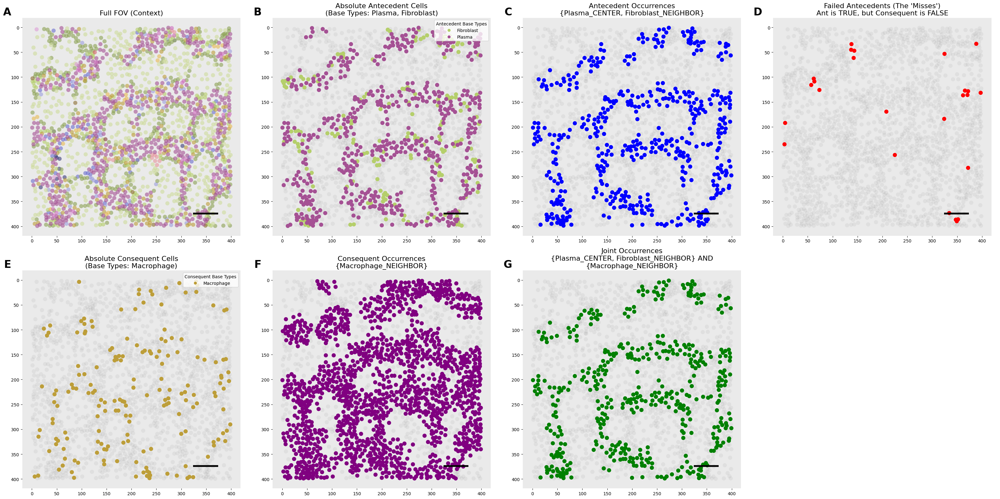


--- Checking Global Pipeline Significance for Control_Colon_01_FOV_5 ---
❌ Not found in fpgrowth for this FOV.


✅ EXACT MATCH FOUND in weighted_fpgrowth_4_items_no_markers_with_ex_per! (Row 257711)
   Stored Confidence: 0.8780247246923514
   Stored Lift: 1.2103682472339174


EVALUATING RULE: ['Fibroblast_CENTER', 'Plasma_NEIGHBOR'] -> ['Macrophage_NEIGHBOR'] (FOV: Control_Colon_01_FOV_5)

Rule: {Fibroblast_CENTER, Plasma_NEIGHBOR} -> {Macrophage_NEIGHBOR}
Total Cells in FOV (N) = 1877
Using Algo: WEIGHTED (Radius: 25.0, Bandwidth: 15.0)

[Absolute Composition of Involved Cells]
  Absolute 'Macrophage' cells: 179  (naive support = 0.0954)
  Absolute 'Fibroblast' cells: 172  (naive support = 0.0916)
  Absolute 'Plasma' cells: 549  (naive support = 0.2925)



[ALGORITHM METRICS (WEIGHTED)]
  Valid transactions (pipeline N): 1839  /  1877 total cells
  Antecedent Support : 0.0928   (weighted sum = 170.69)
  Consequent Support : 0.7254   (weighted sum = 1334.05)
  Joint Support      : 0.0764   (weighted sum = 140.42)
  Confidence         : 0.8227
  Lift               : 1.1341


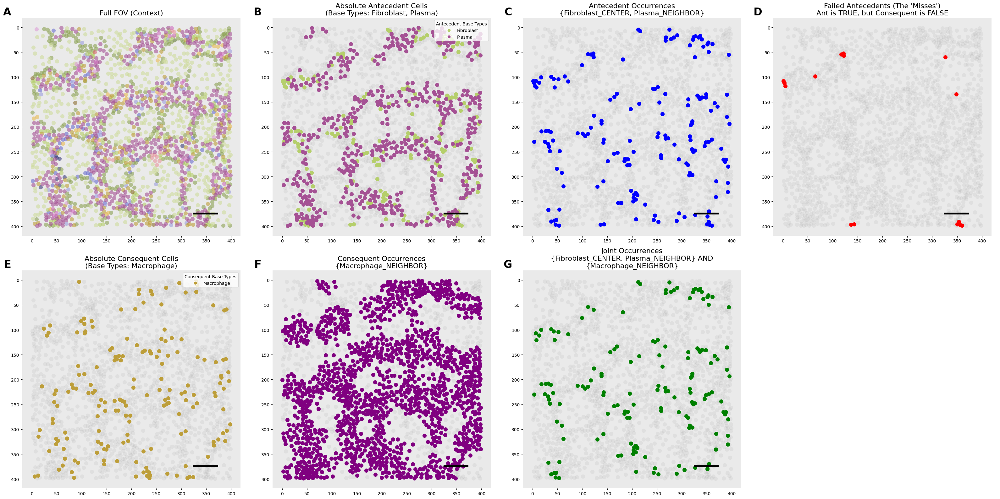


--- Checking Global Pipeline Significance for Control_Colon_01_FOV_5 ---
❌ Not found in fpgrowth for this FOV.


❌ Not found in weighted_fpgrowth_4_items_no_markers_with_ex_per for this FOV.

Note: A rule must pass the pipeline's min_support and min_confidence thresholds to appear in these results. If it's missing, it was filtered out globally.


In [13]:
print('\n\n' + '#'*100)
print('DEMO 7: COMPLEX RULE (Multiple Antecedents) — High Support')
print('Rule: {Plasma, Fibroblast} -> {Macrophage}  |  FOV: Control_Colon_01_FOV_5')
print()
print('This demonstrates a complex rule where the antecedent requires the co-occurrence')
print('of Plasma and Fibroblast cells. Panel C will only highlight areas where both are present.')
evaluate_and_plot('Control_Colon_01_FOV_5', ['Plasma', 'Fibroblast'], ['Macrophage'], algo='weighted')

#### Demo 8: Better Demo 2 (Dense Consequent, Not Edge)

Rule: Epithelial -> Goblet  |  FOV: GVHD_32_FOV_3

In this rule, the absolute support of the consequent (Goblet) is high (~9%), but because these cells are dense in specific internal regions (crypts), the support of the neighborhood (_NEIGHBOR) is not much higher than the absolute support. This results in a substantial Lift without being an edge artifact (unlike Demo 5).



####################################################################################################
DEMO 8: DENSE CONSEQUENT (Not Edge) — High Absolute Support, Moderate Neighbor Support
Rule: Epithelial -> Goblet  |  FOV: GVHD_32_FOV_3

Goblet cells are dense in specific internal regions (crypts).
Because they cluster tightly, their footprint (_NEIGHBOR support) does not expand
massively beyond their absolute cell count. This allows for a robust positive Lift
without being an artifact of the tissue edge.


EVALUATING RULE: ['Epithelial_CENTER'] -> ['Goblet_NEIGHBOR'] (FOV: GVHD_32_FOV_3)

Rule: {Epithelial_CENTER} -> {Goblet_NEIGHBOR}
Total Cells in FOV (N) = 2197
Using Algo: WEIGHTED (Radius: 25.0, Bandwidth: 15.0)

[Absolute Composition of Involved Cells]
  Absolute 'Epithelial' cells: 239  (naive support = 0.1088)
  Absolute 'Goblet' cells: 200  (naive support = 0.0910)



[ALGORITHM METRICS (WEIGHTED)]
  Valid transactions (pipeline N): 2036  /  2197 total cells
  Antecedent Support : 0.1154   (weighted sum = 235.00)
  Consequent Support : 0.1589   (weighted sum = 323.57)
  Joint Support      : 0.0798   (weighted sum = 162.57)
  Confidence         : 0.6918
  Lift               : 4.3528


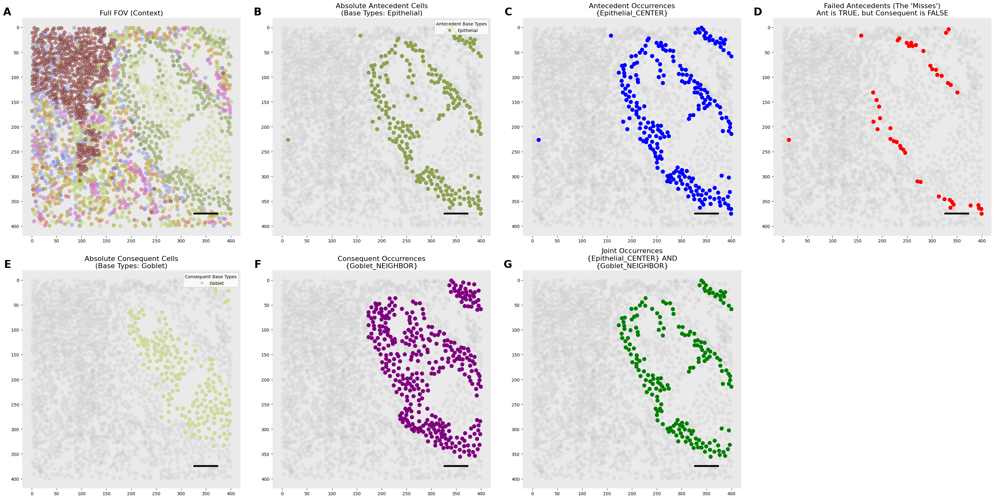


--- Checking Global Pipeline Significance for GVHD_32_FOV_3 ---
✅ EXACT MATCH FOUND in fpgrowth! (Row 6361)
   Stored Confidence: 0.7999999999999999
   Stored Lift: 4.450273224043715


✅ EXACT MATCH FOUND in weighted_fpgrowth_4_items_no_markers_with_ex_per! (Row 148082)
   Stored Confidence: 0.6917723674316167
   Stored Lift: 4.352826409853799


In [14]:
print('\n\n' + '#'*100)
print('DEMO 8: DENSE CONSEQUENT (Not Edge) — High Absolute Support, Moderate Neighbor Support')
print('Rule: Epithelial -> Goblet  |  FOV: GVHD_32_FOV_3')
print()
print('Goblet cells are dense in specific internal regions (crypts).')
print('Because they cluster tightly, their footprint (_NEIGHBOR support) does not expand')
print('massively beyond their absolute cell count. This allows for a robust positive Lift')
print('without being an artifact of the tissue edge.')
evaluate_and_plot('GVHD_32_FOV_3', ['Epithelial'], ['Goblet'], algo='weighted')

#### Demo 9: The Footprint Paradox (Clustered vs. Dispersed)

This demo provides empirical proof for why clustered cells (like Muscle here) have a much smaller `_NEIGHBOR` footprint relative to their absolute count compared to dispersed cells (like CD8T), resolving the paradox of Demo 8.



####################################################################################################
DEMO 9: The Footprint Paradox (Clustered vs. Dispersed)
FOV: Control_01_FOV_3

We compare Muscle cells (clustered) to CD8T cells (dispersed).
Notice that while their absolute cell counts are similar (~135 vs ~125),
their neighborhood footprints (the denominator for Confidence/Lift) are drastically different
because the algorithm caps the weight at 1.0 per patch. Clustered cells hit the cap quickly and "waste" their count.


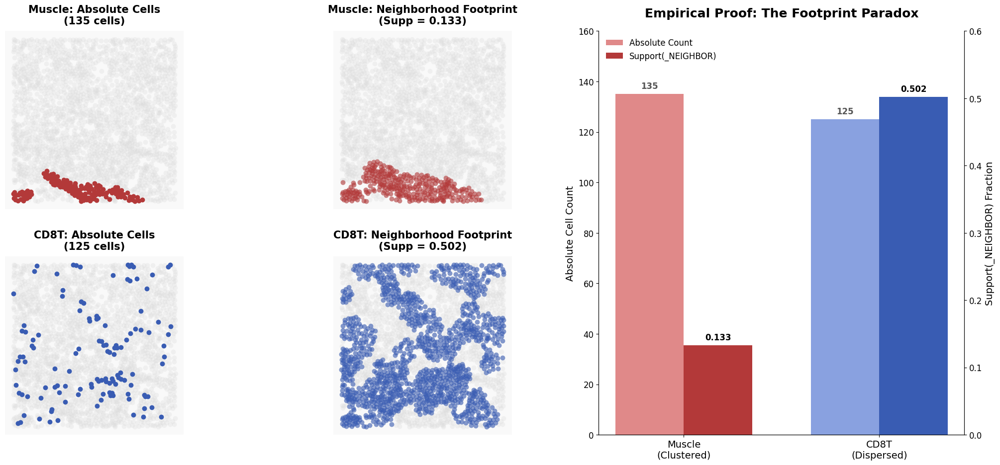

In [16]:
print("\n\n" + "#"*100)
print("DEMO 9: The Footprint Paradox (Clustered vs. Dispersed)")
print("FOV: Control_01_FOV_3")
print()
print("We compare Muscle cells (clustered) to CD8T cells (dispersed).")
print("Notice that while their absolute cell counts are similar (~135 vs ~125),")
print("their neighborhood footprints (the denominator for Confidence/Lift) are drastically different")
print("because the algorithm caps the weight at 1.0 per patch. Clustered cells hit the cap quickly and \"waste\" their count.")

# Define the improved plotting code
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from collections import Counter

radius = 25.0
bandwidth = 15.0
min_cells_per_patch = 2

df_fov = df_cells[df_cells["fov"] == "Control_01_FOV_3"].reset_index(drop=True)
coords = df_fov[["x_um", "y_um"]].values
cell_types = df_fov["cell type"].values
N = len(df_fov)

nn = NearestNeighbors(radius=radius, n_jobs=-1).fit(coords)
neighbors_idx = nn.radius_neighbors(coords, return_distance=False)

valid_indices = []
for i in range(N):
    n_idxs_full = neighbors_idx[i]
    if len(n_idxs_full) < min_cells_per_patch: continue
    all_local = cell_types[n_idxs_full]
    if len(all_local) > 0:
        most_common = Counter(all_local).most_common(1)[0][1]
        if (most_common / len(all_local)) > 0.9: continue
    valid_indices.append(i)

denom = len(valid_indices) if len(valid_indices) > 0 else 1

results = {}
for t in ["Muscle", "CD8T"]:
    abs_mask = cell_types == t
    abs_count = np.sum(abs_mask)
    
    neighbor_weights = np.zeros(N)
    for i in range(N):
        n_idxs_full = neighbors_idx[i]
        n_idxs = n_idxs_full[n_idxs_full != i]
        n_types = cell_types[n_idxs]
        if len(n_idxs) > 0:
            dists = np.linalg.norm(coords[n_idxs] - coords[i], axis=1)
            weights = np.exp(-0.5 * (dists / bandwidth) ** 2)
            w = np.sum(weights[n_types == t])
            neighbor_weights[i] = min(float(w), 1.0)
            
    supp_neighbor = np.sum(neighbor_weights[valid_indices]) / denom
    binary_neighbor_mask = neighbor_weights > 0
    
    results[t] = {
        "abs_mask": abs_mask,
        "abs_count": abs_count,
        "neighbor_mask": binary_neighbor_mask,
        "supp_neighbor": supp_neighbor
    }

# Create the much cleaner plot
fig = plt.figure(figsize=(22, 10), facecolor="white")

import matplotlib.gridspec as gridspec
gs = gridspec.GridSpec(2, 3, width_ratios=[1, 1, 1.2])

ax_m_abs = fig.add_subplot(gs[0, 0])
ax_m_foot = fig.add_subplot(gs[0, 1])
ax_c_abs = fig.add_subplot(gs[1, 0])
ax_c_foot = fig.add_subplot(gs[1, 1])
ax_bar = fig.add_subplot(gs[:, 2])

cell_size = 50
x_max, y_max = df_fov["x_um"].max(), df_fov["y_um"].max()
OTHER_COLOR = (0.85, 0.85, 0.85)

def format_ax(ax, title):
    ax.set_facecolor("#f9f9f9")
    ax.set_title(title, fontsize=15, pad=10, fontweight="bold")
    ax.set_aspect("equal")
    ax.invert_yaxis()
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values(): spine.set_visible(False)

# Muscle
c1 = "#b33939"  # Dark red
res1 = results["Muscle"]
ax_m_abs.scatter(df_fov["x_um"], df_fov["y_um"], s=cell_size, c=[OTHER_COLOR], alpha=0.3, linewidths=0)
g = df_fov[res1["abs_mask"]]
ax_m_abs.scatter(g["x_um"], g["y_um"], s=cell_size, c=[c1], alpha=1.0, linewidths=0)
format_ax(ax_m_abs, f"Muscle: Absolute Cells\n({res1['abs_count']} cells)")

ax_m_foot.scatter(df_fov["x_um"], df_fov["y_um"], s=cell_size, c=[OTHER_COLOR], alpha=0.3, linewidths=0)
g = df_fov[res1["neighbor_mask"]]
ax_m_foot.scatter(g["x_um"], g["y_um"], s=cell_size, c=[c1], alpha=0.6, linewidths=0)
format_ax(ax_m_foot, f"Muscle: Neighborhood Footprint\n(Supp = {res1['supp_neighbor']:.3f})")

# CD8T
c2 = "#395cb3"  # Blue
res2 = results["CD8T"]
ax_c_abs.scatter(df_fov["x_um"], df_fov["y_um"], s=cell_size, c=[OTHER_COLOR], alpha=0.3, linewidths=0)
g = df_fov[res2["abs_mask"]]
ax_c_abs.scatter(g["x_um"], g["y_um"], s=cell_size, c=[c2], alpha=1.0, linewidths=0)
format_ax(ax_c_abs, f"CD8T: Absolute Cells\n({res2['abs_count']} cells)")

ax_c_foot.scatter(df_fov["x_um"], df_fov["y_um"], s=cell_size, c=[OTHER_COLOR], alpha=0.3, linewidths=0)
g = df_fov[res2["neighbor_mask"]]
ax_c_foot.scatter(g["x_um"], g["y_um"], s=cell_size, c=[c2], alpha=0.6, linewidths=0)
format_ax(ax_c_foot, f"CD8T: Neighborhood Footprint\n(Supp = {res2['supp_neighbor']:.3f})")

# Bar Chart
labels = ["Muscle\n(Clustered)", "CD8T\n(Dispersed)"]
abs_counts = [res1["abs_count"], res2["abs_count"]]
supps = [res1["supp_neighbor"], res2["supp_neighbor"]]

x = np.arange(len(labels))
width = 0.35

ax_bar.set_title("Empirical Proof: The Footprint Paradox", fontsize=18, pad=20, fontweight="bold")

rects1 = ax_bar.bar(x - width/2, abs_counts, width, label="Absolute Count", color=["#e08989", "#89a1e0"])
ax_bar.set_ylabel("Absolute Cell Count", fontsize=14)
ax_bar.set_xticks(x)
ax_bar.set_xticklabels(labels, fontsize=14)
ax_bar.tick_params(axis="y", labelsize=12)
ax_bar.set_ylim(0, 160)

ax_bar2 = ax_bar.twinx()
rects2 = ax_bar2.bar(x + width/2, supps, width, label="Support(_NEIGHBOR)", color=[c1, c2])
ax_bar2.set_ylabel("Support(_NEIGHBOR) Fraction", fontsize=14)
ax_bar2.tick_params(axis="y", labelsize=12)
ax_bar2.set_ylim(0, 0.6)

ax_bar.spines["top"].set_visible(False)
ax_bar2.spines["top"].set_visible(False)

for rect in rects1:
    height = rect.get_height()
    ax_bar.annotate(f"{int(height)}",
                xy=(rect.get_x() + rect.get_width() / 2, height),
                xytext=(0, 5), textcoords="offset points",
                ha="center", va="bottom", fontsize=12, fontweight="bold", color="#555555")

for rect in rects2:
    height = rect.get_height()
    ax_bar2.annotate(f"{height:.3f}",
                xy=(rect.get_x() + rect.get_width() / 2, height),
                xytext=(0, 5), textcoords="offset points",
                ha="center", va="bottom", fontsize=12, fontweight="bold", color="black")

lines, labels = ax_bar.get_legend_handles_labels()
lines2, labels2 = ax_bar2.get_legend_handles_labels()
ax_bar.legend(lines + lines2, labels + labels2, loc="upper left", fontsize=12, frameon=False)

plt.tight_layout(pad=3.0)
plt.savefig("../../Weekly Summary #3 (07.06.2026)/demo_clustered_vs_dispersed.png", dpi=150, bbox_inches="tight")
plt.show()




EVALUATING RULE: ['CD3T_CENTER', 'Epithelial_NEIGHBOR'] -> ['Goblet_NEIGHBOR'] (FOV: GVHD_22_FOV_3)

Rule: {CD3T_CENTER, Epithelial_NEIGHBOR} -> {Goblet_NEIGHBOR}
Total Cells in FOV (N) = 1901
Using Algo: WEIGHTED (Radius: 25.0, Bandwidth: 15.0)

[Absolute Composition of Involved Cells]
  Absolute 'Epithelial' cells: 161  (naive support = 0.0847)
  Absolute 'CD3T' cells: 10  (naive support = 0.0053)
  Absolute 'Goblet' cells: 159  (naive support = 0.0836)

[ALGORITHM METRICS (WEIGHTED)]
  Valid transactions (pipeline N): 1846  /  1901 total cells
  Antecedent Support : 0.0034   (weighted sum = 6.32)
  Consequent Support : 0.2888   (weighted sum = 533.18)
  Joint Support      : 0.0031   (weighted sum = 5.70)
  Confidence         : 0.9028
  Lift               : 3.1256


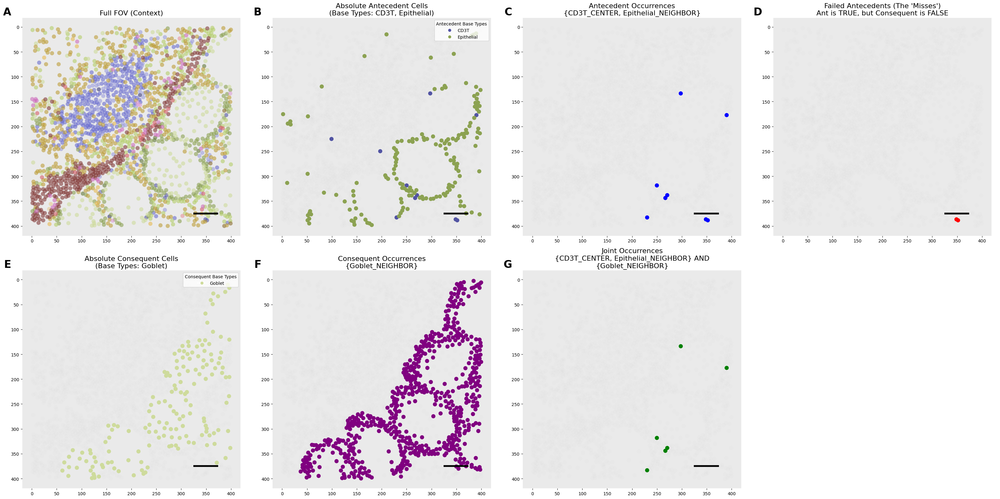


--- Checking Global Pipeline Significance for GVHD_22_FOV_3 ---
❌ Not found in fpgrowth for this FOV.
❌ Not found in weighted_fpgrowth_4_items_no_markers_with_ex_per for this FOV.

Note: A rule must pass the pipeline's min_support and min_confidence thresholds to appear in these results. If it's missing, it was filtered out globally.


EVALUATING RULE: ['Epithelial_CENTER', 'CD3T_NEIGHBOR'] -> ['Goblet_NEIGHBOR'] (FOV: GVHD_22_FOV_3)

Rule: {Epithelial_CENTER, CD3T_NEIGHBOR} -> {Goblet_NEIGHBOR}
Total Cells in FOV (N) = 1901
Using Algo: WEIGHTED (Radius: 25.0, Bandwidth: 15.0)

[Absolute Composition of Involved Cells]
  Absolute 'Epithelial' cells: 161  (naive support = 0.0847)
  Absolute 'CD3T' cells: 10  (naive support = 0.0053)
  Absolute 'Goblet' cells: 159  (naive support = 0.0836)

[ALGORITHM METRICS (WEIGHTED)]
  Valid transactions (pipeline N): 1846  /  1901 total cells
  Antecedent Support : 0.0128   (weighted sum = 23.65)
  Consequent Support : 0.2888   (weighted sum = 533.1

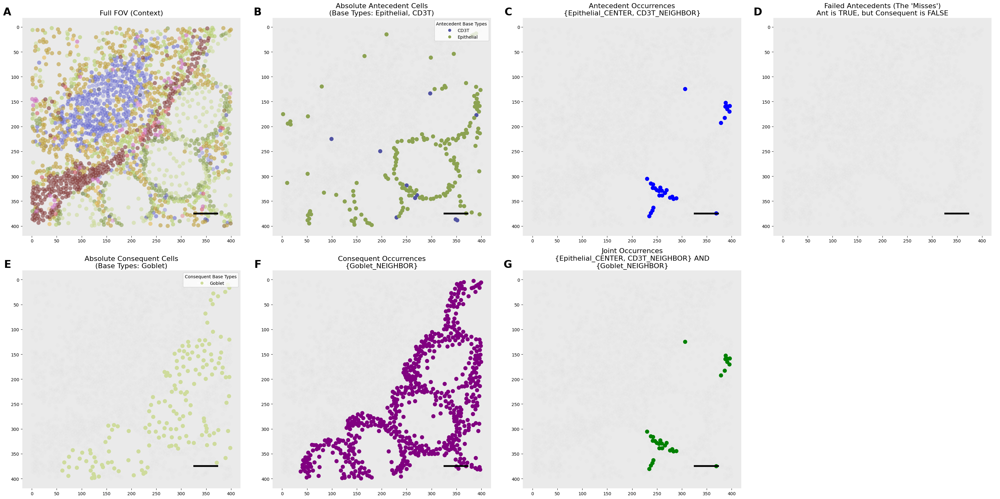


--- Checking Global Pipeline Significance for GVHD_22_FOV_3 ---
❌ Not found in fpgrowth for this FOV.
✅ EXACT MATCH FOUND in weighted_fpgrowth_4_items_no_markers_with_ex_per! (Row 112098)
   Stored Confidence: 1.0
   Stored Lift: 3.46226247164153


In [17]:
evaluate_and_plot('GVHD_22_FOV_3', ['CD3T', 'Epithelial'], ['Goblet'], algo="weighted")